Use virtual environment's python interpreter to run the notebook


In [1]:
import pandas as pd
import numpy as np
pd.set_option('display.float_format', lambda x: f'{x:.128f}')


In [2]:
df32 = pd.read_csv("data32.csv").astype(np.float128, errors='ignore')
df64 = pd.read_csv("data64.csv").astype(np.float128, errors='ignore')
dataNone = pd.read_csv("dataNone.csv").astype(np.float128, errors='ignore')

In [3]:
df32.shot.nunique()

212

In [4]:
nan_columns = df32.columns[df32.isna().all()]
print("Columns with NaNs:", nan_columns.tolist())

Columns with NaNs: ['time_until_disrupt']


In [5]:
# Drop time_until_disrupt from df32, df64, and dataNone
df32 = df32.drop(columns=['time_until_disrupt'])
df64 = df64.drop(columns=['time_until_disrupt'])
dataNone = dataNone.drop(columns=['time_until_disrupt'])

### Differences between 64 and 32 casting precision

In [6]:
# Compute absolute differences
diff_abs = (df32.abs() - df64.abs()).abs()

# Get the maximum difference for each column
max_differences = diff_abs.max()

# Divide by the maximum value of each column in shot_data64
# max_differences = max_differences  

# Sort the differences in descending order and get the top 10
top_10_differences = max_differences.sort_values(ascending=False).head(10)

# Display the column names and their corresponding max differences
top_10_differences
# covert to  pd.DataFrame
top_10_differences_df = top_10_differences.reset_index()
top_10_differences_df.columns = ['column_name', 'max_difference']
top_10_differences_df

,column_name,max_difference
0,dn_dt,5693538828036341760.000000000000000000000000000...
1,n_e,35308598394880.00000000000000000000000000000000...
2,dprad_dt,3643.477287292480468750000000000000000000000000...
3,te_width_ece,2824.562162394207916804589331150054931640625000...
4,dip_dt,289.9192507266998291015625000000000000000000000...
5,dip_smoothed,179.9643965778523124754428863525390625000000000...
6,p_input,100.9918901151977479457855224609375000000000000...
7,p_oh,100.9918872395064681768417358398437500000000000...
8,dipprog_dt,7.265183150768280029296875000000000000000000000...
9,p_rad,1.878856986761093139648437500000000000000000000...


In [7]:
# Get the position of the maximum difference for each column
max_positions = diff_abs.idxmax()


# Get the corresponding values from df32 and df64 
for i in range(len(max_positions)):
    print(f"Column: {max_positions.index[i]}")
    print(f"Shot: {df32.loc[max_positions.iloc[i], 'shot']}")
    print(f"Max difference in row: {max_positions.iloc[i]}")
    print(f"Value in df32: {df32.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"Value in df64: {df64.loc[max_positions.iloc[i], max_positions.index[i]]}")
    # print(f"Value in dataNone: {dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")

    print(f"Absolute difference: {diff_abs.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"relative difference 64 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df64.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"relative difference 32 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df32.loc[max_positions.iloc[i], max_positions.index[i]]}")

    # print(f"relative difference None: {diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print() 

Column: idx
Shot: 950112023.0
Max difference in row: 0
Value in df32: 0.0
Value in df64: 0.0
Absolute difference: 0.0
relative difference 64 %: nan
relative difference 32 %: nan

Column: shot
Shot: 950112023.0
Max difference in row: 0
Value in df32: 950112023.0
Value in df64: 950112023.0
Absolute difference: 0.0
relative difference 64 %: 0.0
relative difference 32 %: 0.0

Column: time
Shot: 950112023.0
Max difference in row: 0
Value in df32: 0.1000000014901161
Value in df64: 0.1000000014901161
Absolute difference: 0.0
relative difference 64 %: 0.0
relative difference 32 %: 0.0

Column: a_minor
Shot: 1000511006.0
Max difference in row: 3426
Value in df32: 0.2174199
Value in df64: 0.2174198925495147
Absolute difference: 7.45048531203274e-09
relative difference 64 %: 3.426772603309968e-06
relative difference 32 %: 3.4267724858822674e-06

Column: beta_n
Shot: 1120920017.0
Max difference in row: 15345
Value in df32: -71.32113832375035
Value in df64: -71.32112899835842
Absolute difference: 9

/tmp/ipykernel_3330964/3318831767.py:15: RuntimeWarning: invalid value encountered in scalar divide
  print(f"relative difference 64 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df64.loc[max_positions.iloc[i], max_positions.index[i]]}")
/tmp/ipykernel_3330964/3318831767.py:16: RuntimeWarning: invalid value encountered in scalar divide
  print(f"relative difference 32 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df32.loc[max_positions.iloc[i], max_positions.index[i]]}")


In [8]:
# Get the position of the maximum difference for each column
max_positions = diff_abs.idxmax()

# Build a DataFrame with the relevant information
rows = []
for col in max_positions.index:
    shot = df32.loc[max_positions[col], 'shot']
    time = df32.loc[max_positions[col], 'time']
    row_idx = max_positions[col]
    val32 = df32.loc[row_idx, col]
    val64 = df64.loc[row_idx, col]
    abs_diff = diff_abs.loc[row_idx, col]
    rel_diff_64 = 100 * abs_diff / val64 if val64 != 0 else np.nan
    rel_diff_32 = 100 * abs_diff / val32 if val32 != 0 else np.nan
    rows.append({
        'column': col,
        'shot': shot,
        'time': time,
        'row_index': row_idx,
        'df32_value': val32,
        'df64_value': val64,
        'absolute_difference': abs_diff,
        'relative_difference_64_percent': rel_diff_64,
        'relative_difference_32_percent': rel_diff_32
    })

max_diff_df = pd.DataFrame(rows)
max_diff_df

,column,shot,time,row_index,df32_value,df64_value,absolute_difference,relative_difference_64_percent,relative_difference_32_percent
0,idx,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,NaN,NaN
1,shot,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,950112023.0000000000000000000000000000000000000...,950112023.0000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...
2,time,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,0.100000001490116105506977817185543244704604148...,0.100000001490116105506977817185543244704604148...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...
3,a_minor,1000511006.000000000000000000000000000000000000...,0.359999984502792302887286268742172978818416595...,3426,0.217419899999999999273825324053177610039710998...,0.217419892549514687241085653113259468227624893...,0.000000007450485312032739670939918141812086105...,0.000003426772603309968098978834094570089519038...,0.000003426772485882267387571073827268186562378...
4,beta_n,1120920017.000000000000000000000000000000000000...,1.699999928474426491575854925031308084726333618...,15345,-71.3211383237503468990325927734375000000000000...,-71.3211289983584180163234123028814792633056640...,0.000009325391928882709180470556020736694335937...,-0.00001307521636273782121768528841077028346262...,-0.00001307521465312521633276784949195814533595...
...,...,...,...,...,...,...,...,...,...
58,wmhd,990225018.0000000000000000000000000000000000000...,1.119999885559082031250000000000000000000000000...,3135,141230.6000000000058207660913467407226562500000...,141230.5937500000000000000000000000000000000000...,0.006250000005820766091346740722656250000000000...,0.000004425386766329279477532113173943173478619...,0.000004425386570488807681279797012763310704031...
59,z_error,1160921011.000000000000000000000000000000000000...,1.979999899864196777343750000000000000000000000...,17442,-0.45548505868738681234830778521427419036626815...,-0.45548507865867049471120253656408749520778656...,0.000000019971283682362894751349813304841518402...,-0.00000438461864462719125783802739948491478116...,-0.00000438461883687600618850687891892015102257...
60,z_prog,1110106023.000000000000000000000000000000000000...,0.879999995231628417968750000000000000000000000...,12090,0.015075014902862400589800273564833332784473896...,0.015075013974047200490669062844517611665651202...,0.000000000928815200099131210720315721118822693...,0.000006161289148375969771233382626940411341820...,0.000006161288768761153660934344611366242361327...
61,z_times_v_z,1160921011.000000000000000000000000000000000000...,1.979999899864196777343750000000000000000000000...,17442,5.281936684722856156781745085027068853378295898...,5.281981962706120192763137310976162552833557128...,0.000045277983264035981392225949093699455261230...,0.000857215787250411058104115902267494675470516...,0.000857223135502460545191716345669874499435536...


In [9]:
max_diff_df_sorted = max_diff_df.sort_values(by='relative_difference_64_percent', ascending=False)
max_diff_df_sorted[['column','relative_difference_64_percent']]

,column,relative_difference_64_percent
50,te_width_ece,3443194.839211545418947935104370117187500000000...
16,greenwald_fraction,99.99999999979034726038662483915686607360839843...
49,te_width,23.45612035765856262514716945588588714599609375...
41,radiated_fraction,0.191327800653822488463617901288671419024467468...
10,dip_smoothed,0.138805720741711491328373995202127844095230102...
...,...,...
19,ip_error,-0.00012131023023506392634601053215348542835272...
57,v_z,-0.00085275785877103095228984885878276145376730...
28,n_equal_1_phase,-0.00243136276082638654733036887023445160593837...
13,dn_dt,-0.64046224578619015410652082209708169102668762...


In [10]:
# import matplotlib.pyplot as plt
# # Filter df64 by the given shot number (for example, shot = 1160921011)
# shot_number = 1160826029#1160921011
# df64_shot = df64[df64['shot'] == shot_number]
# df32_shot = df32[df32['shot'] == shot_number]

# # Plot all signals (excluding 'shot' and 'time' columns)
# # df64_shot.set_index('time').drop(columns=['shot']).plot(subplots=True, figsize=(12, 30), layout=(-1, 2), legend=True)
# # df32_shot.set_index('time').drop(columns=['shot']).plot(subplots=True, figsize=(12, 30), layout=(-1, 2), legend=True)
# # Plot all signals from both dataframes for comparison
# signals = [col for col in df64_shot.columns if col not in ['shot', 'time']]
# fig, axes = plt.subplots(len(signals), 1, figsize=(12, 2 * len(signals)), sharex=True)
# if len(signals) == 1:
#     axes = [axes]
# for idx, signal in enumerate(signals):
#     axes[idx].plot(df64_shot['time'], df64_shot[signal], label='float64', color='b')
#     axes[idx].plot(df32_shot['time'], df32_shot[signal], label='float32', color='r', linestyle='--')
#     axes[idx].set_ylabel(signal)
#     axes[idx].legend()
# axes[-1].set_xlabel('time')
# plt.tight_layout()
# plt.show()

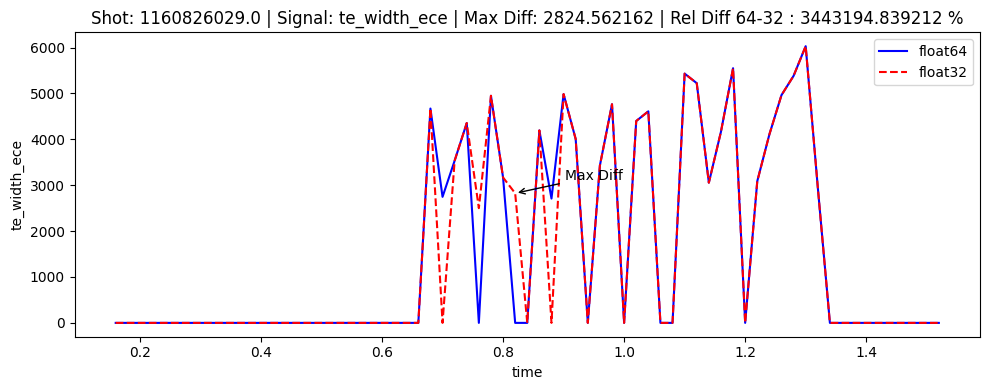

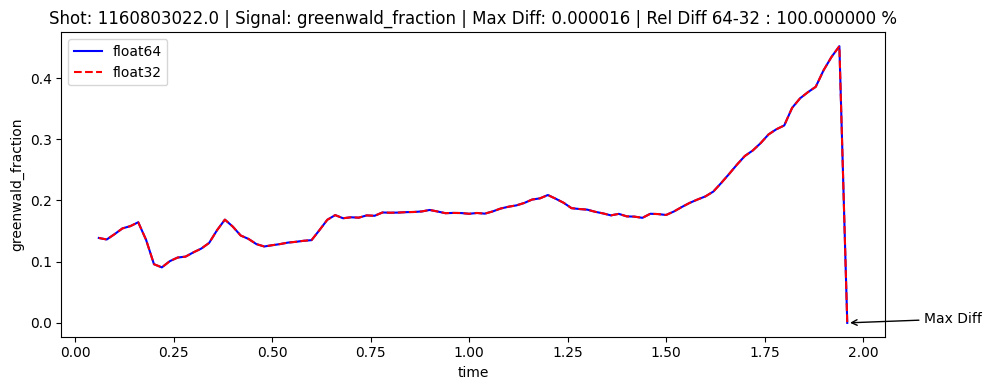

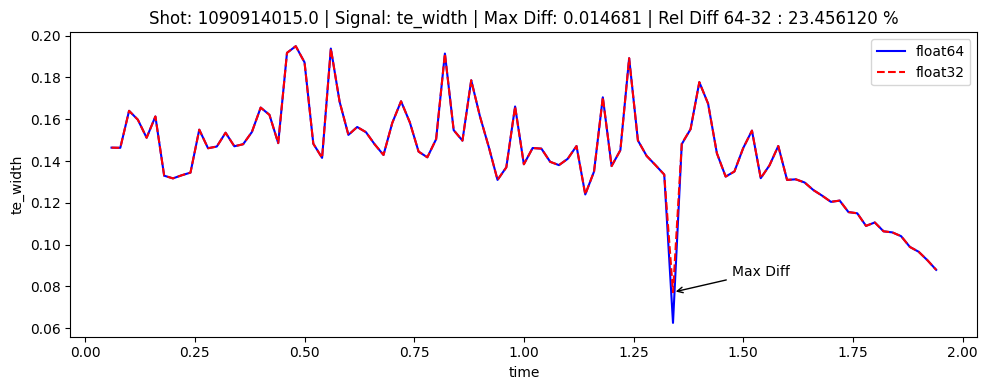

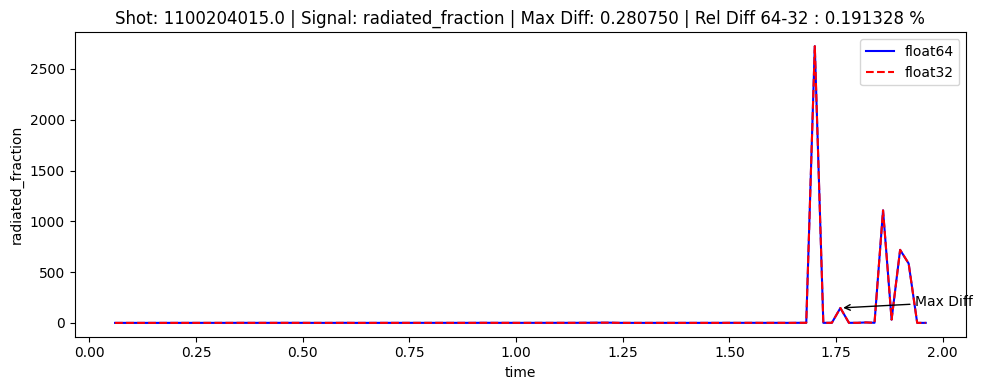

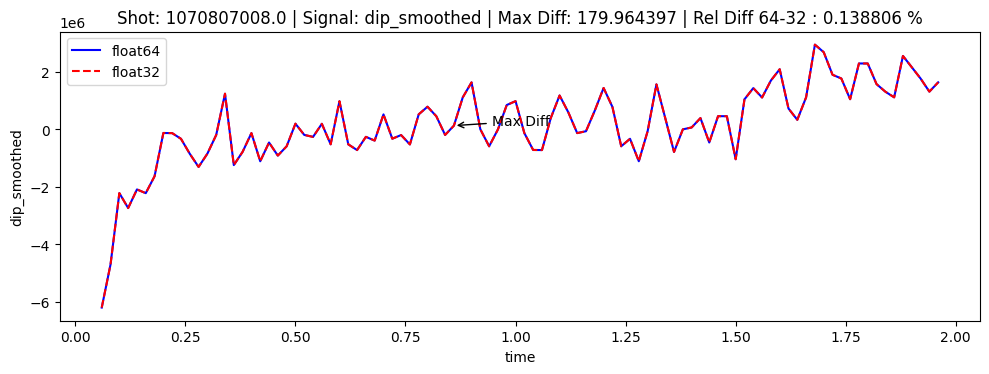

...

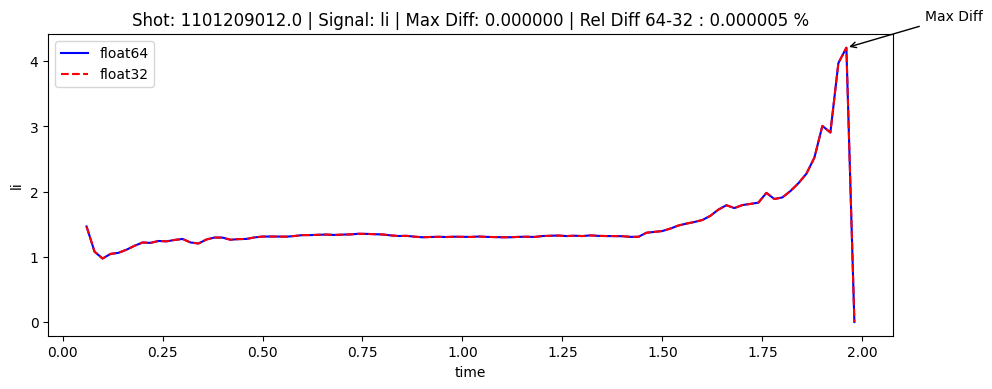

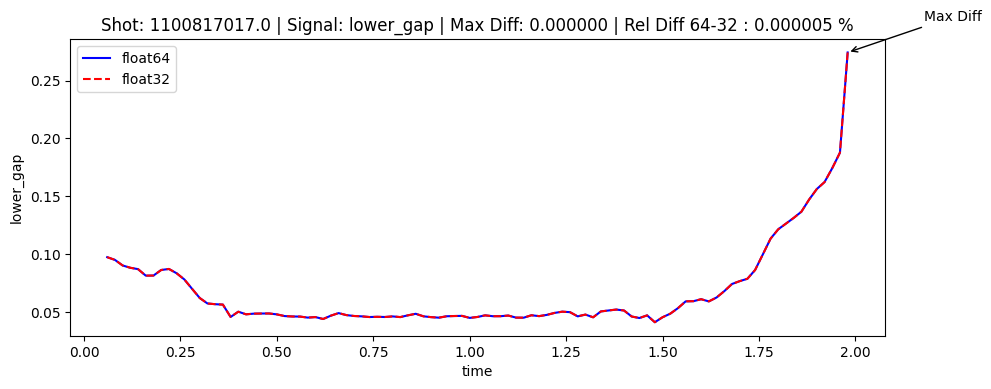

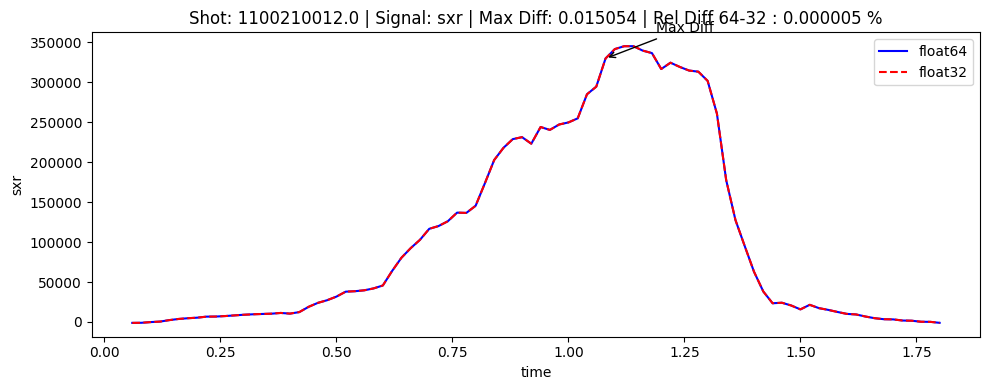

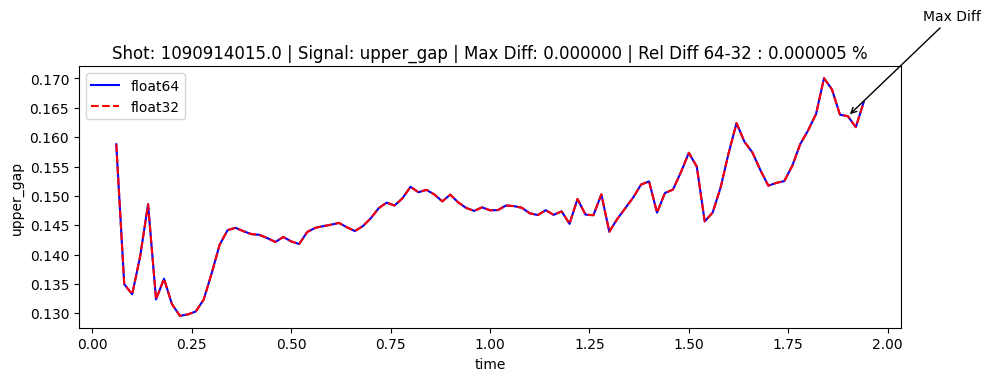

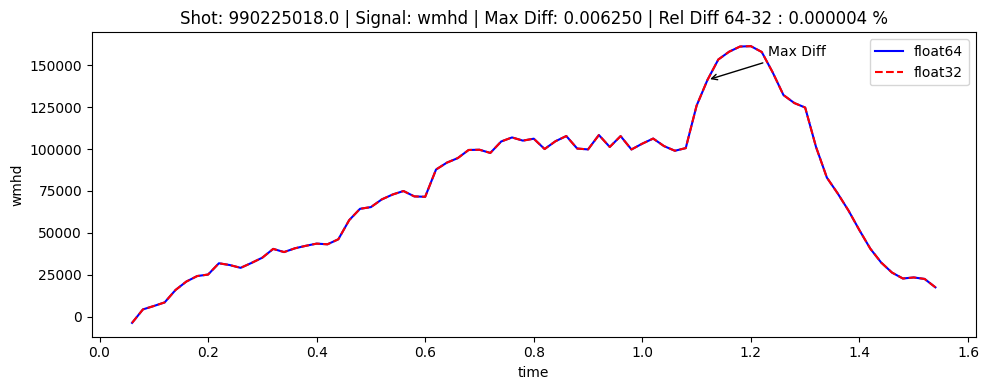

/tmp/ipykernel_3330964/3070125884.py:24: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


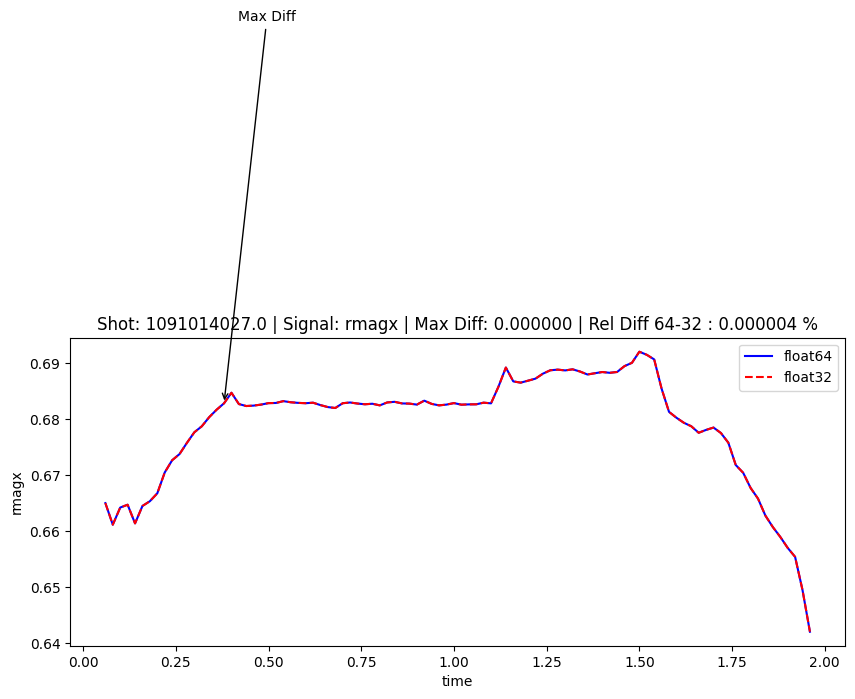

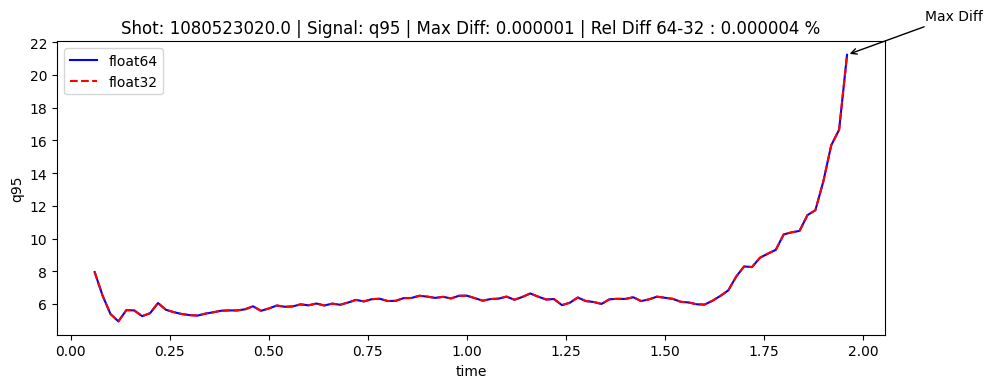

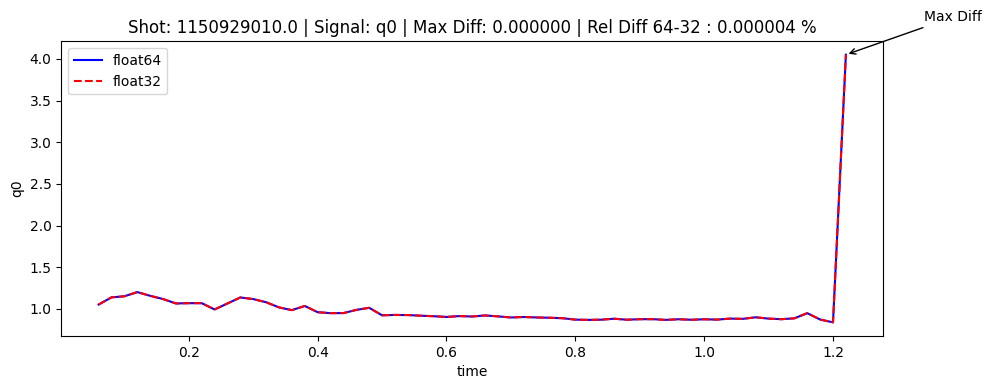

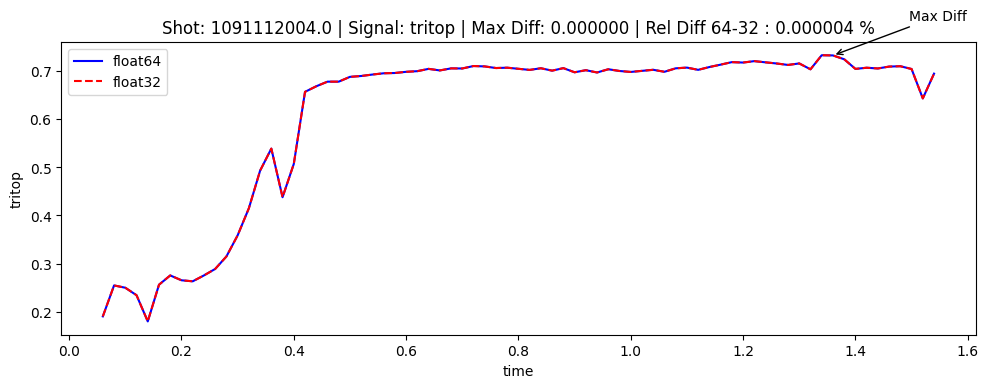

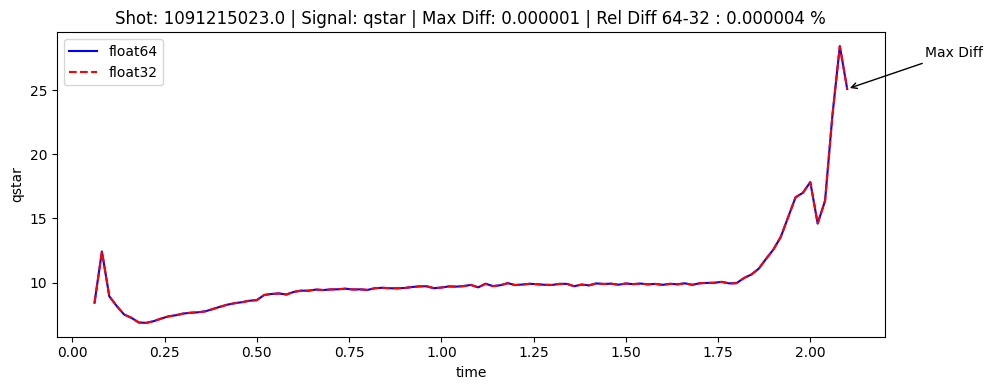

...

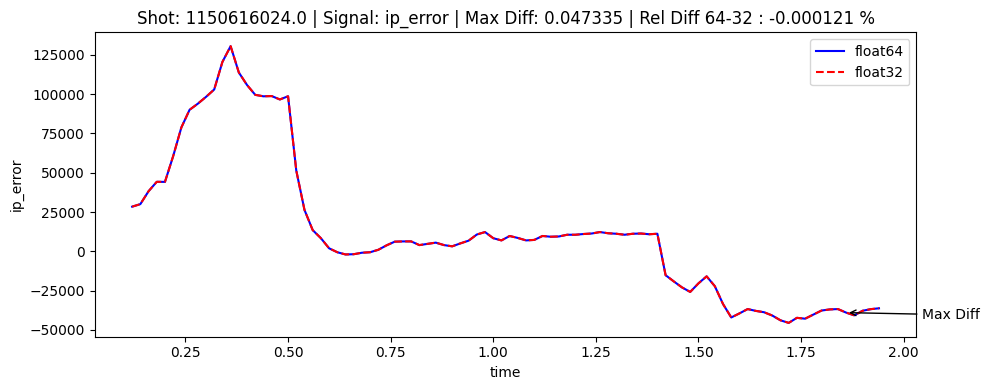

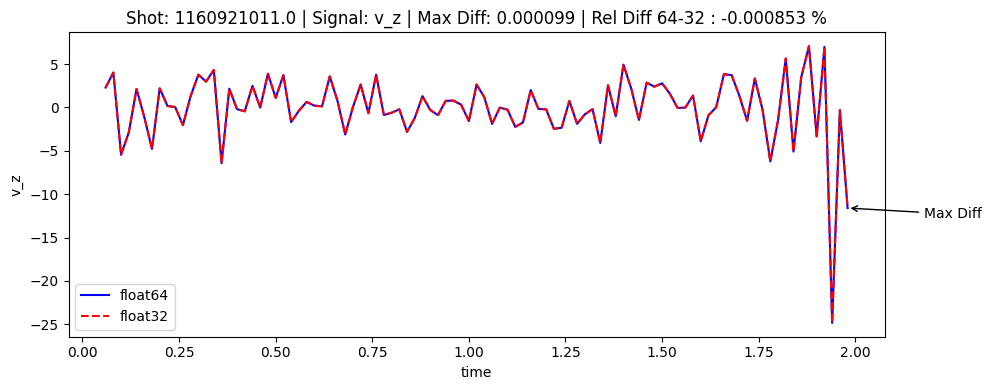

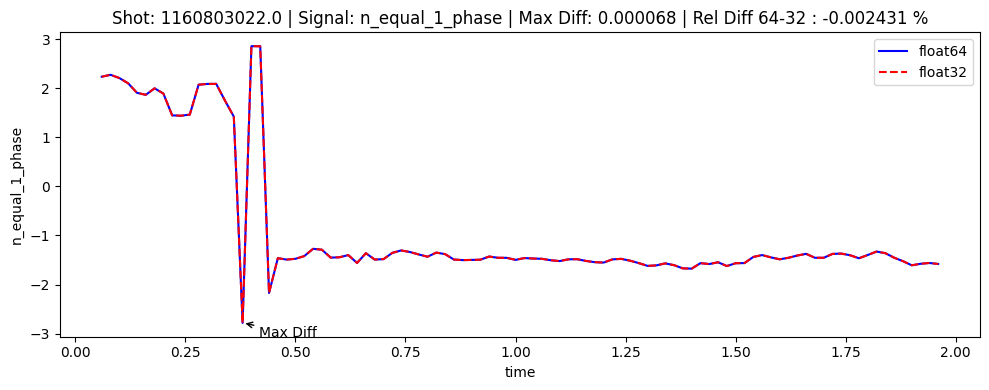

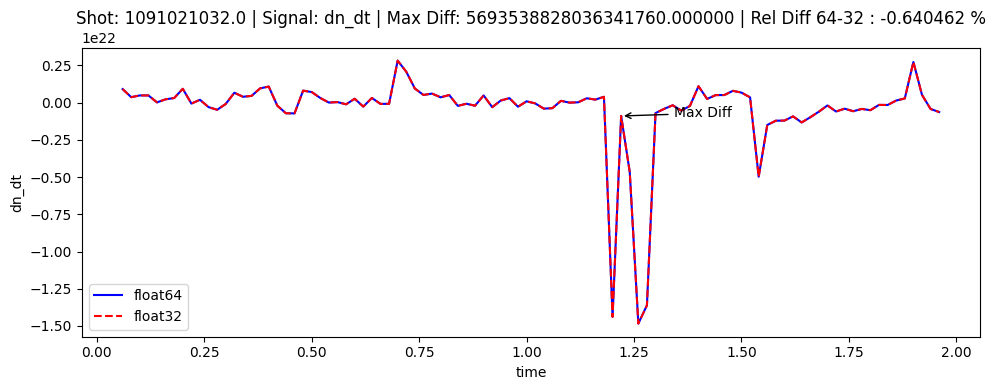

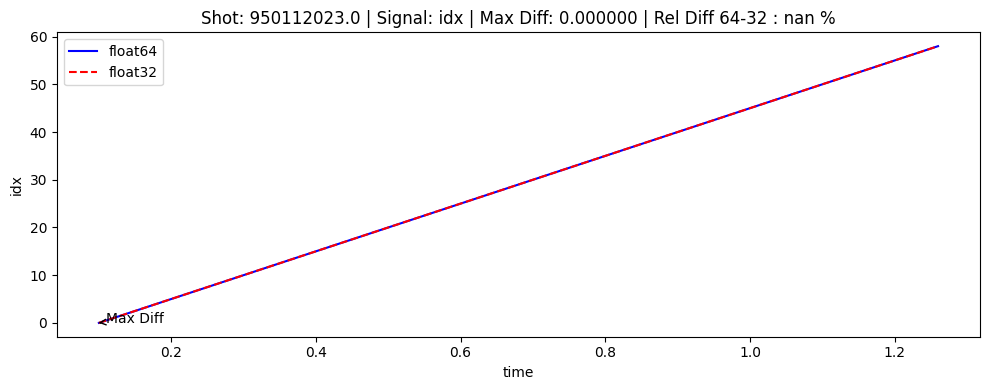

In [11]:
import matplotlib.pyplot as plt

for idx, row in max_diff_df_sorted.iterrows():
    shot = row['shot']
    signal = row['column']
    # Filter for the current shot
    df32_shot = df32[df32['shot'] == shot]
    df64_shot = df64[df64['shot'] == shot]
    if signal not in df32_shot.columns or signal not in df64_shot.columns:
        continue
    plt.figure(figsize=(10, 4))
    plt.plot(df64_shot['time'], df64_shot[signal], label='float64', color='b')
    plt.plot(df32_shot['time'], df32_shot[signal], label='float32', color='r', linestyle='--')
    # add an arrow to the plot indicating the maximum difference time
    max_time = df32_shot.loc[row['row_index'], 'time']
    max_value_32 = df32_shot.loc[row['row_index'], signal]
    max_value_64 = df64_shot.loc[row['row_index'], signal]
    plt.annotate('Max Diff', xy=(max_time, max_value_32), xytext=(max_time + 0.1*max_time, max_value_32 + 0.1*max_value_32),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    plt.title(f"Shot: {shot} | Signal: {signal} | Max Diff: {row['absolute_difference']:.6f} | Rel Diff 64-32 : {row['relative_difference_64_percent']:.6f} %")
    plt.xlabel('time')
    plt.ylabel(signal)
    plt.legend()
    plt.tight_layout()
    plt.show()

### Differences between 64 and None casting precision

In [12]:
# Compute absolute differences
diff_abs = (dataNone.abs() - df64.abs()).abs()

# Get the maximum difference for each column
max_differences = diff_abs.max()

# Divide by the maximum value of each column in shot_data64
# max_differences = max_differences  

# Sort the differences in descending order and get the top 10
top_10_differences = max_differences.sort_values(ascending=False).head(10)

# Display the column names and their corresponding max differences
top_10_differences
# covert to  pd.DataFrame
top_10_differences_df = top_10_differences.reset_index()
top_10_differences_df.columns = ['column_name', 'max_difference']
top_10_differences_df

,column_name,max_difference
0,dn_dt,5693538828036341760.000000000000000000000000000...
1,n_e,35308598394880.00000000000000000000000000000000...
2,dprad_dt,3643.477287292480468750000000000000000000000000...
3,te_width_ece,2824.562162394207916804589331150054931640625000...
4,dip_dt,289.9192507266998291015625000000000000000000000...
5,dip_smoothed,179.9643965778523124754428863525390625000000000...
6,p_input,100.9918901151977479457855224609375000000000000...
7,p_oh,100.9918872395064681768417358398437500000000000...
8,dipprog_dt,7.265183150768280029296875000000000000000000000...
9,p_rad,1.878856986761093139648437500000000000000000000...


In [13]:
# Get the position of the maximum difference for each column
max_positions = diff_abs.idxmax()


# Get the corresponding values from dataNone and df64 
for i in range(len(max_positions)):
    print(f"Column: {max_positions.index[i]}")
    print(f"Shot: {dataNone.loc[max_positions.iloc[i], 'shot']}")
    print(f"Max difference in row: {max_positions.iloc[i]}")
    print(f"Value in df32: {dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"Value in dataNone: {df64.loc[max_positions.iloc[i], max_positions.index[i]]}")
    # print(f"Value in dataNone: {dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")

    print(f"Absolute difference: {diff_abs.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"relative difference 64 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df64.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"relative difference 32 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")

    # print(f"relative difference None: {diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print() 

Column: idx
Shot: 950112023.0
Max difference in row: 0
Value in df32: 0.0
Value in dataNone: 0.0
Absolute difference: 0.0
relative difference 64 %: nan
relative difference 32 %: nan

Column: shot
Shot: 950112023.0
Max difference in row: 0
Value in df32: 950112023.0
Value in dataNone: 950112023.0
Absolute difference: 0.0
relative difference 64 %: 0.0
relative difference 32 %: 0.0

Column: time
Shot: 950112023.0
Max difference in row: 0
Value in df32: 0.1000000014901161
Value in dataNone: 0.1000000014901161
Absolute difference: 0.0
relative difference 64 %: 0.0
relative difference 32 %: 0.0

Column: a_minor
Shot: 1000511006.0
Max difference in row: 3426
Value in df32: 0.2174199
Value in dataNone: 0.2174198925495147
Absolute difference: 7.45048531203274e-09
relative difference 64 %: 3.426772603309968e-06
relative difference 32 %: 3.4267724858822674e-06

Column: beta_n
Shot: 1120920017.0
Max difference in row: 15345
Value in df32: -71.32113832375035
Value in dataNone: -71.32112899835842
Ab

/tmp/ipykernel_3330964/1509528893.py:15: RuntimeWarning: invalid value encountered in scalar divide
  print(f"relative difference 64 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df64.loc[max_positions.iloc[i], max_positions.index[i]]}")
/tmp/ipykernel_3330964/1509528893.py:16: RuntimeWarning: invalid value encountered in scalar divide
  print(f"relative difference 32 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")


In [14]:
# Get the position of the maximum difference for each column
max_positions = diff_abs.idxmax()

# Build a DataFrame with the relevant information
rows = []
for col in max_positions.index:
    shot = dataNone.loc[max_positions[col], 'shot']
    time = dataNone.loc[max_positions[col], 'time']
    row_idx = max_positions[col]
    valNone = dataNone.loc[row_idx, col]
    val64 = df64.loc[row_idx, col]
    abs_diff = diff_abs.loc[row_idx, col]
    rel_diff_64 = 100 * abs_diff / val64 if val64 != 0 else np.nan
    rel_diff_none = 100 * abs_diff / valNone if valNone != 0 else np.nan
    rows.append({
        'column': col,
        'shot': shot,
        'time': time,
        'row_index': row_idx,
        'dataNone_value': valNone,
        'df64_value': val64,
        'absolute_difference': abs_diff,
        'relative_difference_64_percent': rel_diff_64,
        'relative_difference_None_percent': rel_diff_none
    })

max_diff_df = pd.DataFrame(rows)
max_diff_df

,column,shot,time,row_index,dataNone_value,df64_value,absolute_difference,relative_difference_64_percent,relative_difference_None_percent
0,idx,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,NaN,NaN
1,shot,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,950112023.0000000000000000000000000000000000000...,950112023.0000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...
2,time,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,0.100000001490116105506977817185543244704604148...,0.100000001490116105506977817185543244704604148...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...
3,a_minor,1000511006.000000000000000000000000000000000000...,0.359999984502792302887286268742172978818416595...,3426,0.217419899999999999273825324053177610039710998...,0.217419892549514687241085653113259468227624893...,0.000000007450485312032739670939918141812086105...,0.000003426772603309968098978834094570089519038...,0.000003426772485882267387571073827268186562378...
4,beta_n,1120920017.000000000000000000000000000000000000...,1.699999928474426491575854925031308084726333618...,15345,-71.3211383237503468990325927734375000000000000...,-71.3211289983584180163234123028814792633056640...,0.000009325391928882709180470556020736694335937...,-0.00001307521636273782121768528841077028346262...,-0.00001307521465312521633276784949195814533595...
...,...,...,...,...,...,...,...,...,...
58,wmhd,990225018.0000000000000000000000000000000000000...,1.119999885559082031250000000000000000000000000...,3135,141230.6000000000058207660913467407226562500000...,141230.5937500000000000000000000000000000000000...,0.006250000005820766091346740722656250000000000...,0.000004425386766329279477532113173943173478619...,0.000004425386570488807681279797012763310704031...
59,z_error,1160921011.000000000000000000000000000000000000...,1.979999899864196777343750000000000000000000000...,17442,-0.45548505868738681234830778521427419036626815...,-0.45548507865867049471120253656408749520778656...,0.000000019971283682362894751349813304841518402...,-0.00000438461864462719125783802739948491478116...,-0.00000438461883687600618850687891892015102257...
60,z_prog,1110106023.000000000000000000000000000000000000...,0.879999995231628417968750000000000000000000000...,12090,0.015075014902862400589800273564833332784473896...,0.015075013974047200490669062844517611665651202...,0.000000000928815200099131210720315721118822693...,0.000006161289148375969771233382626940411341820...,0.000006161288768761153660934344611366242361327...
61,z_times_v_z,1160921011.000000000000000000000000000000000000...,1.979999899864196777343750000000000000000000000...,17442,5.281936684722856156781745085027068853378295898...,5.281981962706120192763137310976162552833557128...,0.000045277983264035981392225949093699455261230...,0.000857215787250411058104115902267494675470516...,0.000857223135502460545191716345669874499435536...


In [15]:
max_diff_df_sorted = max_diff_df.sort_values(by='relative_difference_64_percent', ascending=False)
max_diff_df_sorted[['column','relative_difference_64_percent']]

,column,relative_difference_64_percent
50,te_width_ece,3443194.839211545418947935104370117187500000000...
16,greenwald_fraction,99.99999999979034726038662483915686607360839843...
49,te_width,23.45612035765856262514716945588588714599609375...
41,radiated_fraction,0.191327800653822488463617901288671419024467468...
10,dip_smoothed,0.138805720741711491328373995202127844095230102...
...,...,...
57,v_z,-0.00085275785877103095228984885878276145376730...
28,n_equal_1_phase,-0.00243136276082638654733036887023445160593837...
13,dn_dt,-0.64046224578619015410652082209708169102668762...
0,idx,NaN


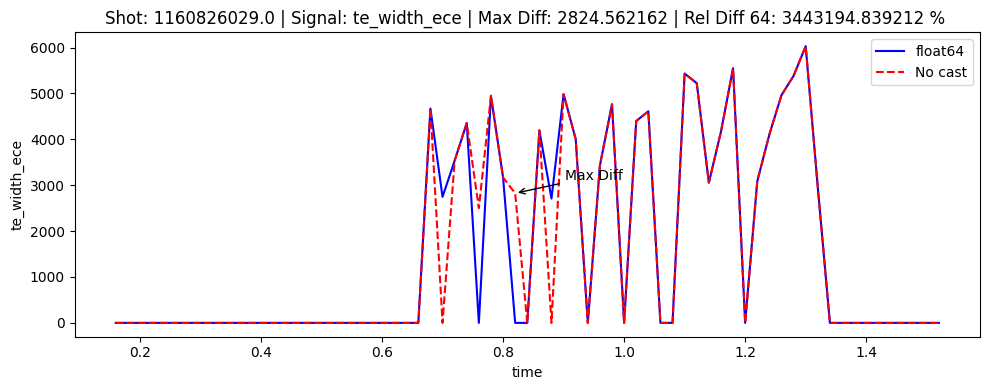

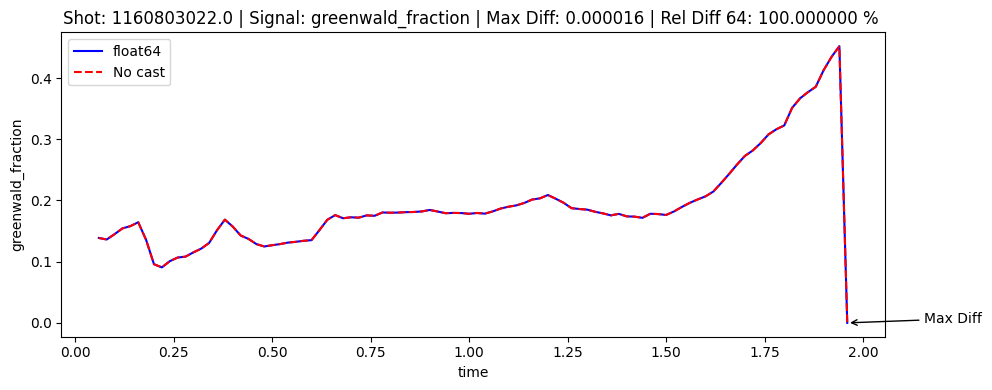

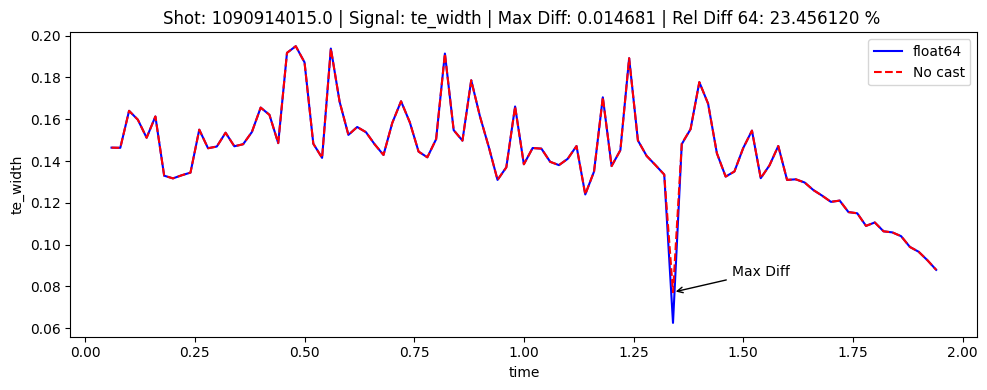

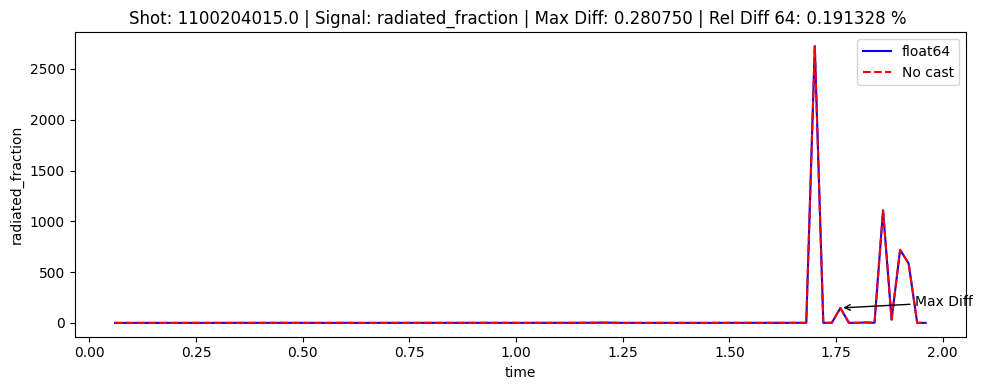

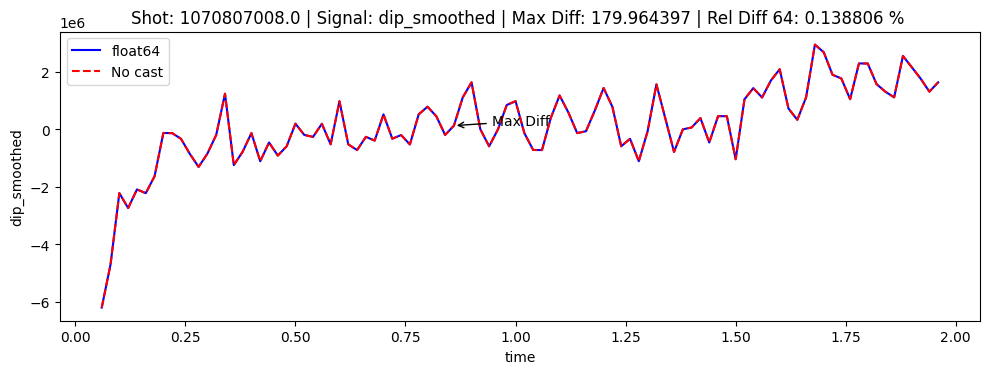

...

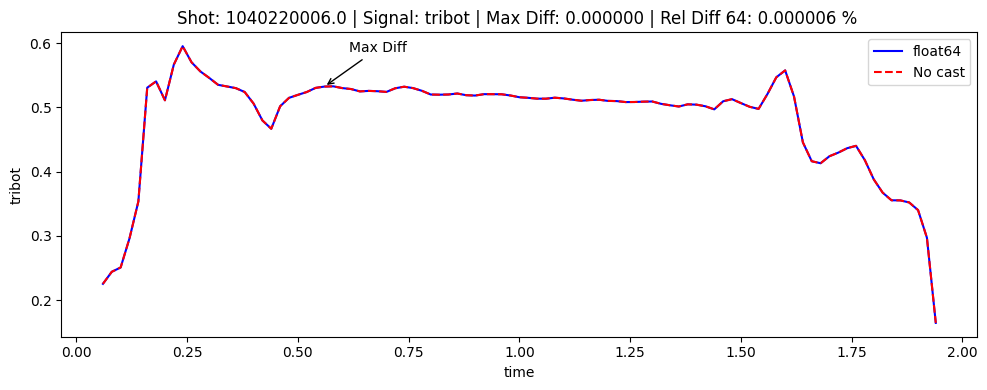

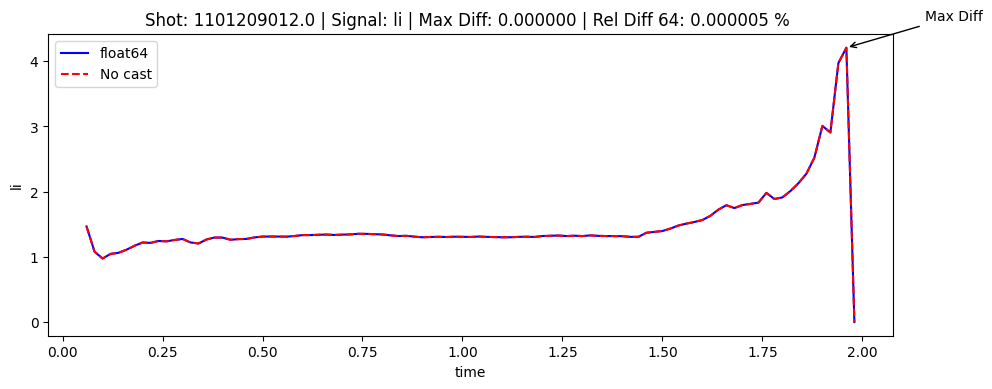

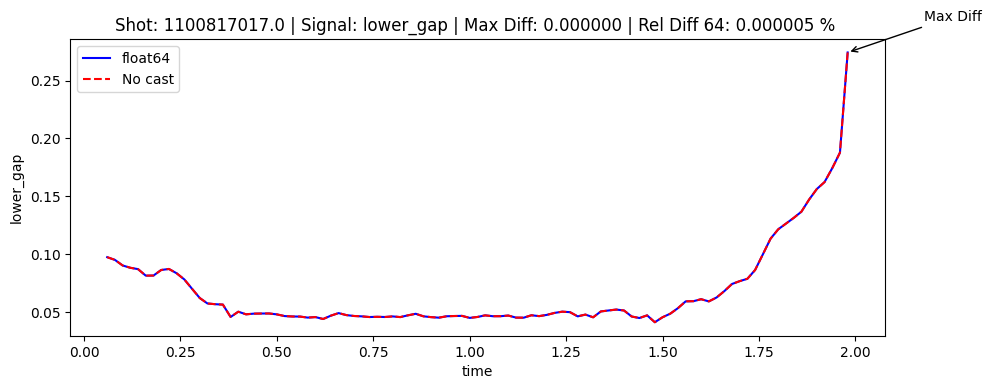

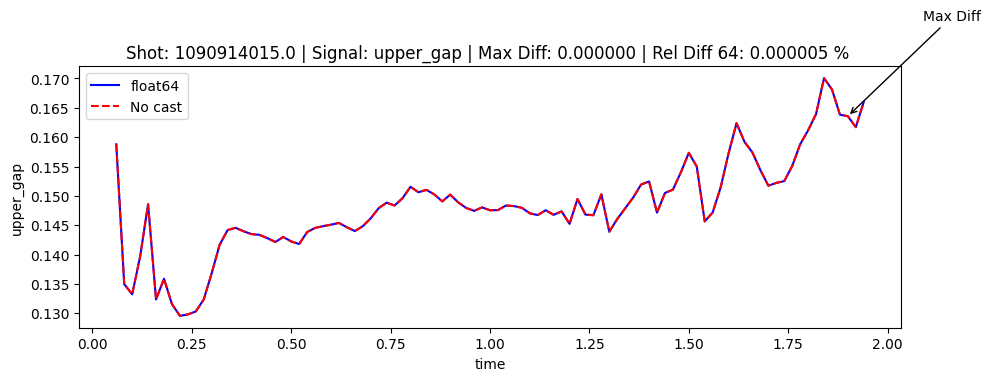

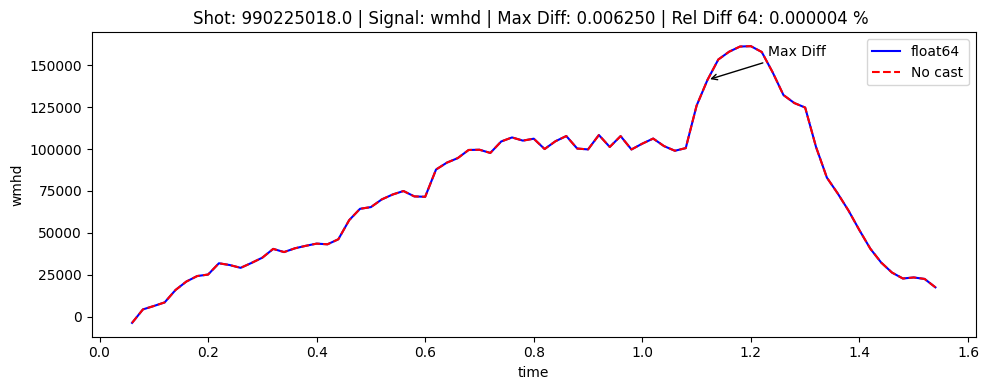

/tmp/ipykernel_3330964/3476305594.py:24: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


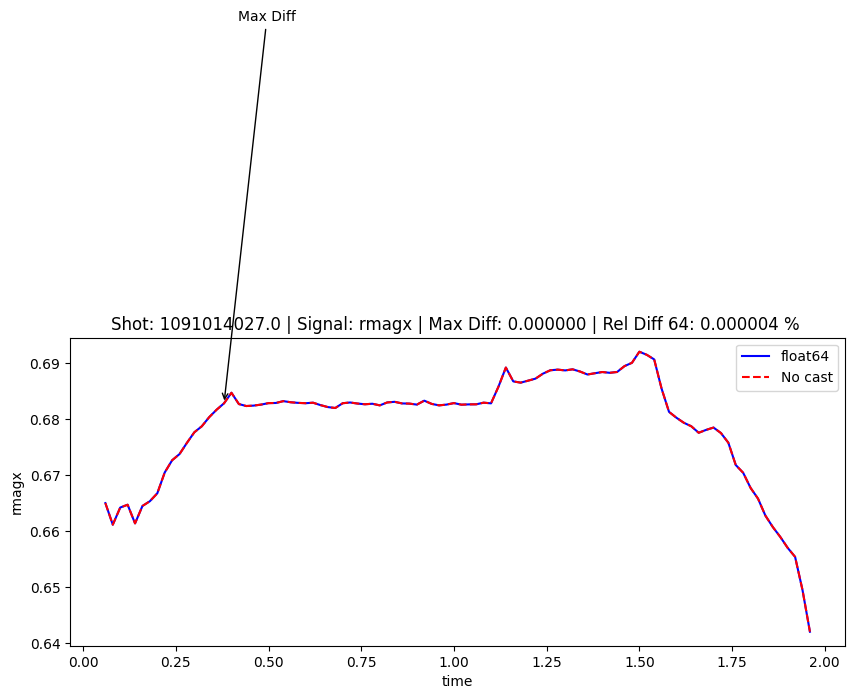

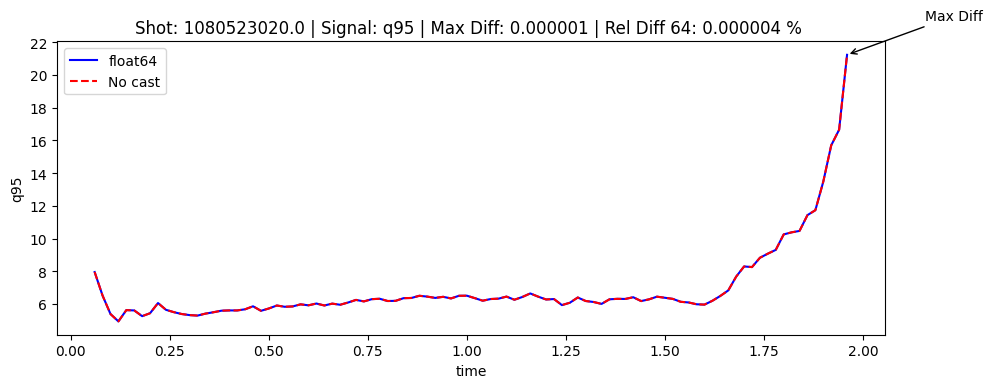

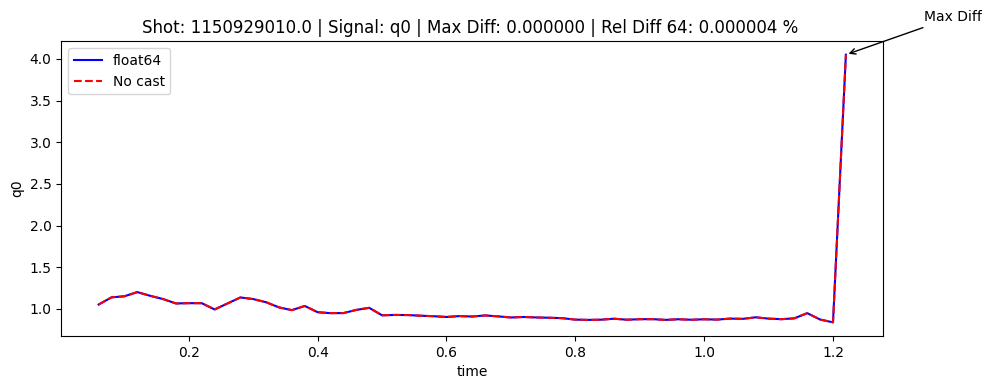

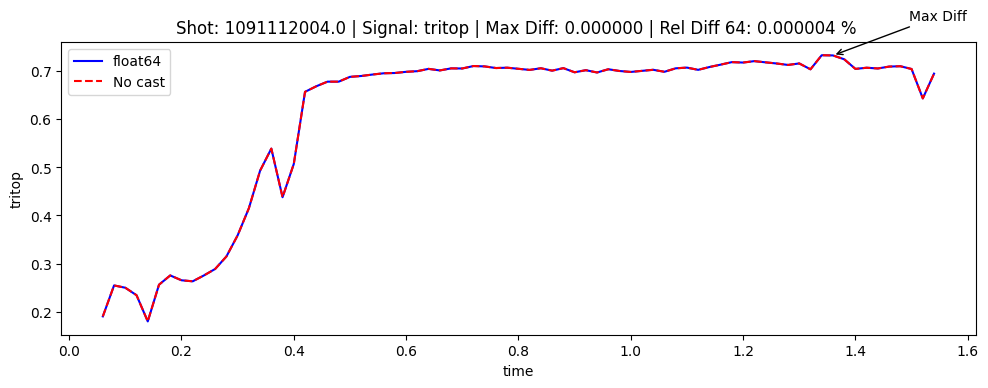

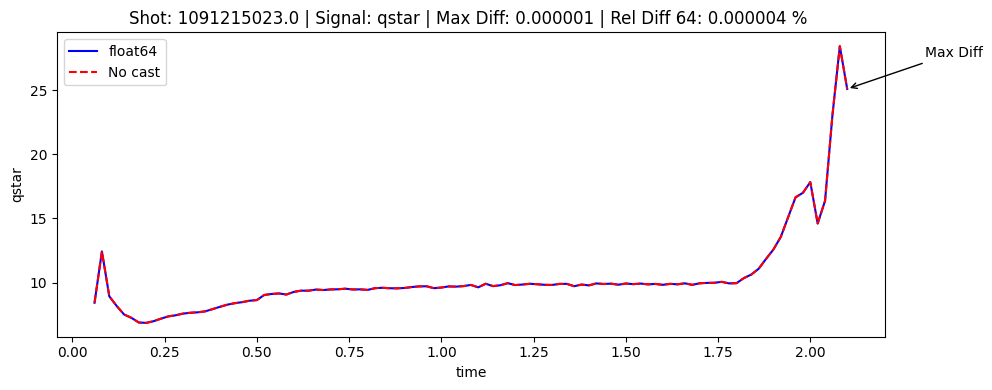

...

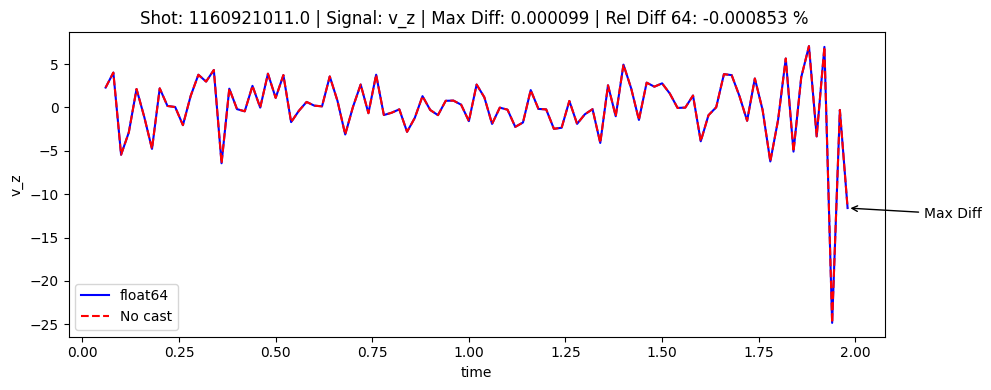

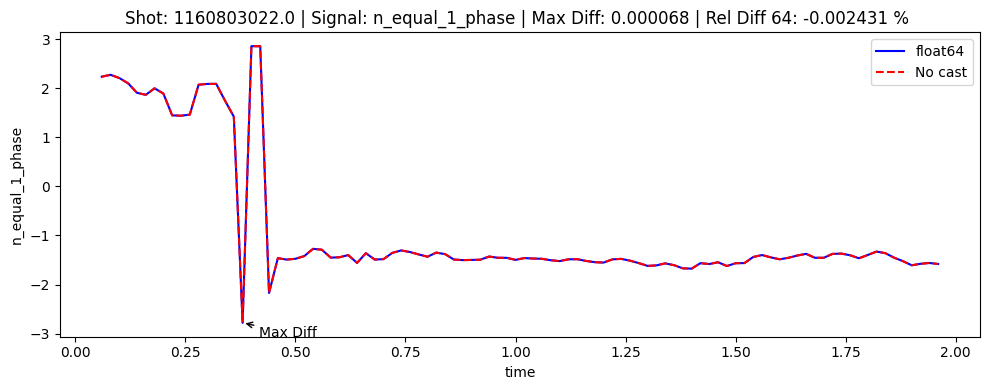

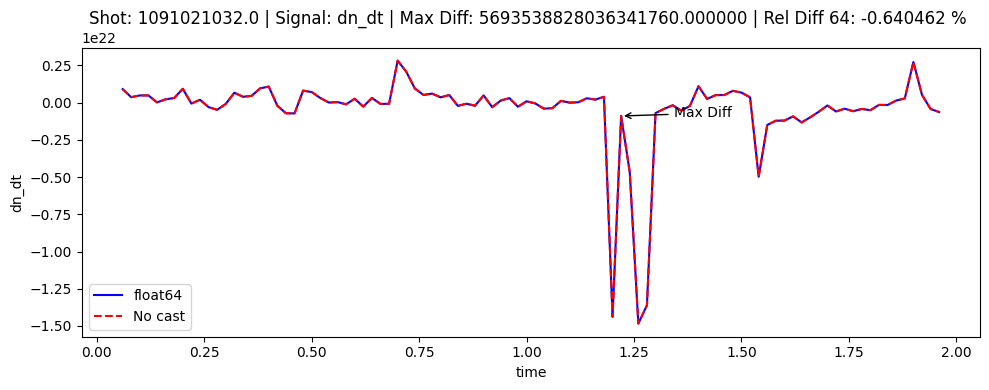

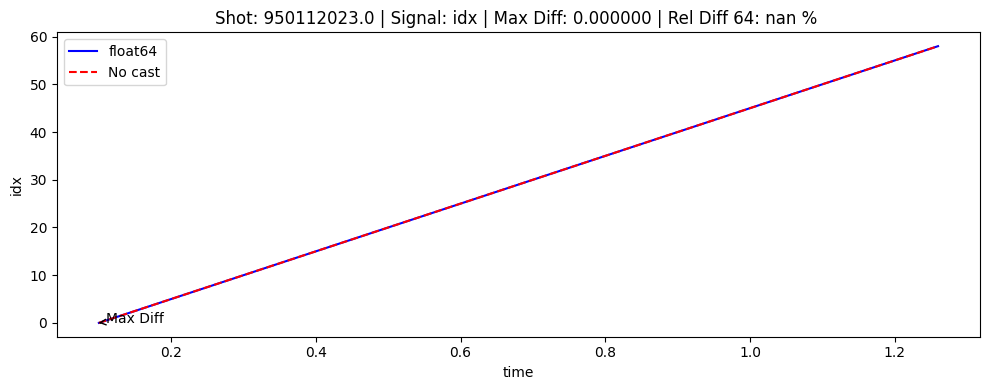

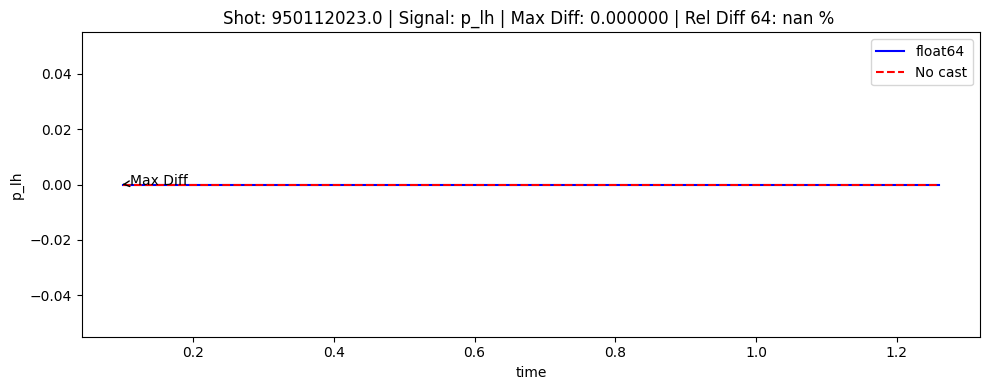

In [16]:
import matplotlib.pyplot as plt

for idx, row in max_diff_df_sorted.iterrows():
    shot = row['shot']
    signal = row['column']
    # Filter for the current shot
    dfNone_shot = dataNone[dataNone['shot'] == shot]
    df64_shot = df64[df64['shot'] == shot]
    if signal not in dfNone_shot.columns or signal not in df64_shot.columns:
        continue
    plt.figure(figsize=(10, 4))
    plt.plot(df64_shot['time'], df64_shot[signal], label='float64', color='b')
    plt.plot(dfNone_shot['time'], dfNone_shot[signal], label='No cast', color='r', linestyle='--')
    # add an arrow to the plot indicating the maximum difference time
    max_time = dfNone_shot.loc[row['row_index'], 'time']
    max_value_none = dfNone_shot.loc[row['row_index'], signal]
    max_value_64 = df64_shot.loc[row['row_index'], signal]
    plt.annotate('Max Diff', xy=(max_time, max_value_none), xytext=(max_time + 0.1*max_time, max_value_none + 0.1*max_value_none),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    plt.title(f"Shot: {shot} | Signal: {signal} | Max Diff: {row['absolute_difference']:.6f} | Rel Diff 64: {row['relative_difference_64_percent']:.6f} % ")
    plt.xlabel('time')
    plt.ylabel(signal)
    plt.legend()
    plt.tight_layout()
    plt.show()

### Differences between 32 and None casting precision

In [17]:
# Compute absolute differences
diff_abs = (df32.abs() - dataNone.abs()).abs()

# Get the maximum difference for each column
max_differences = diff_abs.max()

# Divide by the maximum value of each column in shot_data64
# max_differences = max_differences  

# Sort the differences in descending order and get the top 10
top_10_differences = max_differences.sort_values(ascending=False).head(10)

# Display the column names and their corresponding max differences
top_10_differences
# covert to  pd.DataFrame
top_10_differences_df = top_10_differences.reset_index()
top_10_differences_df.columns = ['column_name', 'max_difference']
top_10_differences_df

,column_name,max_difference
0,p_icrf,0.184462616685777902603149414062500000000000000...
1,p_input,0.184462616685777902603149414062500000000000000...
2,p_lh,0.040089512011036276817321777343750000000000000...
3,sxr,0.015054184710606932640075683593750000000000000...
4,radiated_fraction,0.000000460320497275290563266025856137275695800...
5,z_prog,0.000000000000000000000000000000000000000000000...
6,z_error,0.000000000000000000000000000000000000000000000...
7,p_oh,0.000000000000000000000000000000000000000000000...
8,p_rad,0.000000000000000000000000000000000000000000000...
9,prad_peaking,0.000000000000000000000000000000000000000000000...


In [18]:
# Get the position of the maximum difference for each column
max_positions = diff_abs.idxmax()


# Get the corresponding values from df32 and df64 
for i in range(len(max_positions)):
    print(f"Column: {max_positions.index[i]}")
    print(f"Shot: {dataNone.loc[max_positions.iloc[i], 'shot']}")
    print(f"Max difference in row: {max_positions.iloc[i]}")
    print(f"Value in df None: {dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"Value in df 32: {df32.loc[max_positions.iloc[i], max_positions.index[i]]}")
    # print(f"Value in dataNone: {dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")

    print(f"Absolute difference: {diff_abs.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"relative difference None %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df32.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print(f"relative difference 32 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")

    # print(f"relative difference None: {diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")
    print() 

Column: idx
Shot: 950112023.0
Max difference in row: 0
Value in df None: 0.0
Value in df 32: 0.0
Absolute difference: 0.0
relative difference None %: nan
relative difference 32 %: nan

Column: shot
Shot: 950112023.0
Max difference in row: 0
Value in df None: 950112023.0
Value in df 32: 950112023.0
Absolute difference: 0.0
relative difference None %: 0.0
relative difference 32 %: 0.0

Column: time
Shot: 950112023.0
Max difference in row: 0
Value in df None: 0.1000000014901161
Value in df 32: 0.1000000014901161
Absolute difference: 0.0
relative difference None %: 0.0
relative difference 32 %: 0.0

Column: a_minor
Shot: 950112023.0
Max difference in row: 0
Value in df None: 0.21028739
Value in df 32: 0.21028739
Absolute difference: 0.0
relative difference None %: 0.0
relative difference 32 %: 0.0

Column: beta_n
Shot: 950112023.0
Max difference in row: 0
Value in df None: -0.1273789405822754
Value in df 32: -0.1273789405822754
Absolute difference: 0.0
relative difference None %: -0.0
rela

/tmp/ipykernel_3330964/489130742.py:15: RuntimeWarning: invalid value encountered in scalar divide
  print(f"relative difference None %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / df32.loc[max_positions.iloc[i], max_positions.index[i]]}")
/tmp/ipykernel_3330964/489130742.py:16: RuntimeWarning: invalid value encountered in scalar divide
  print(f"relative difference 32 %: {100*diff_abs.loc[max_positions.iloc[i], max_positions.index[i]] / dataNone.loc[max_positions.iloc[i], max_positions.index[i]]}")


In [19]:
# Get the position of the maximum difference for each column
max_positions = diff_abs.idxmax()

# Build a DataFrame with the relevant information
rows = []
for col in max_positions.index:
    shot = df32.loc[max_positions[col], 'shot']
    time = dataNone.loc[max_positions[col], 'time']
    row_idx = max_positions[col]
    val32 = df32.loc[row_idx, col]
    valNone = dataNone.loc[row_idx, col]
    abs_diff = diff_abs.loc[row_idx, col]
    rel_diff_32 = 100 * abs_diff / val32 if val32 != 0 else np.nan
    rel_diff_None = 100 * abs_diff / valNone if valNone != 0 else np.nan
    rows.append({
        'column': col,
        'shot': shot,
        'time': time,
        'row_index': row_idx,
        'df32_value': val32,
        'df64_value': valNone,
        'absolute_difference': abs_diff,
        'relative_difference_None_percent': rel_diff_None,
        'relative_difference_32_percent': rel_diff_32
    })

max_diff_df = pd.DataFrame(rows)
max_diff_df

,column,shot,time,row_index,df32_value,df64_value,absolute_difference,relative_difference_None_percent,relative_difference_32_percent
0,idx,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,NaN,NaN
1,shot,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,950112023.0000000000000000000000000000000000000...,950112023.0000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...
2,time,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,0.100000001490116105506977817185543244704604148...,0.100000001490116105506977817185543244704604148...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...
3,a_minor,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,0.210287389999999990708445807285897899419069290...,0.210287389999999990708445807285897899419069290...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...
4,beta_n,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,-0.12737894058227539062500000000000000000000000...,-0.12737894058227539062500000000000000000000000...,0.000000000000000000000000000000000000000000000...,-0.00000000000000000000000000000000000000000000...,-0.00000000000000000000000000000000000000000000...
...,...,...,...,...,...,...,...,...,...
58,wmhd,950112023.0000000000000000000000000000000000000...,0.100000001490116105506977817185543244704604148...,0,-4583.78560000000015861587598919868469238281250...,-4583.78560000000015861587598919868469238281250...,0.000000000000000000000000000000000000000000000...,-0.00000000000000000000000000000000000000000000...,-0.00000000000000000000000000000000000000000000...
59,z_error,1050621015.000000000000000000000000000000000000...,0.059999998658895402348090186706031090579926967...,4947,-0.00344832314172850012967685984222043771296739...,-0.00344832314172850012967685984222043771296739...,0.000000000000000000000000000000000000000000000...,-0.00000000000000000000000000000000000000000000...,-0.00000000000000000000000000000000000000000000...
60,z_prog,1050621015.000000000000000000000000000000000000...,0.059999998658895402348090186706031090579926967...,4947,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,NaN,NaN
61,z_times_v_z,1050621015.000000000000000000000000000000000000...,0.059999998658895402348090186706031090579926967...,4947,0.013239643278301800599638937683266703970730304...,0.013239643278301800599638937683266703970730304...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...,0.000000000000000000000000000000000000000000000...


In [20]:
max_diff_df_sorted = max_diff_df.sort_values(by='relative_difference_32_percent', ascending=False)
max_diff_df_sorted[['column','relative_difference_32_percent']]

,column,relative_difference_32_percent
41,radiated_fraction,0.000008982226828569043157587600822999718275241...
31,p_icrf,0.000008477561637401374622542704617700337621499...
32,p_input,0.000006445764180874693924589227678190184178674...
33,p_lh,0.000006179878253906220753001368034551532559817...
44,sxr,0.000004567170830455691377483019854910395451952...
...,...,...
62,zcur,-0.00000000000000000000000000000000000000000000...
0,idx,NaN
14,dprad_dt,NaN
34,p_oh,NaN


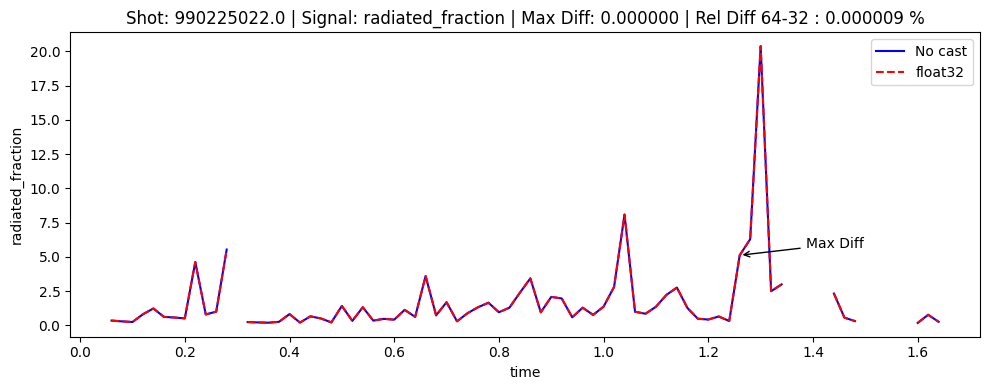

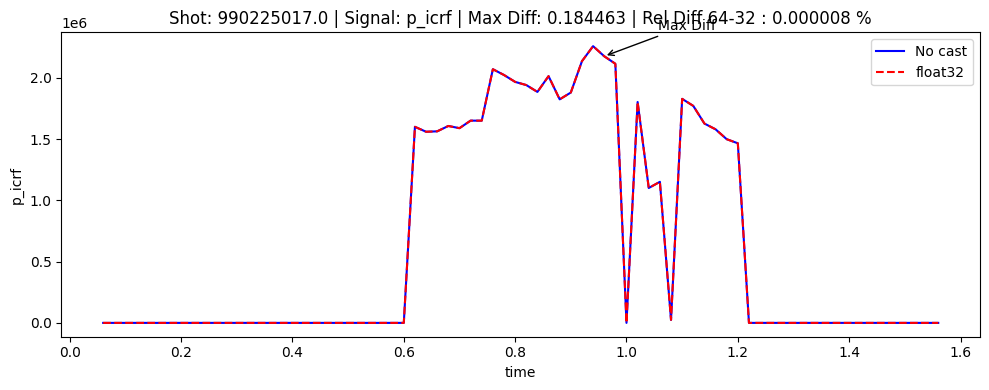

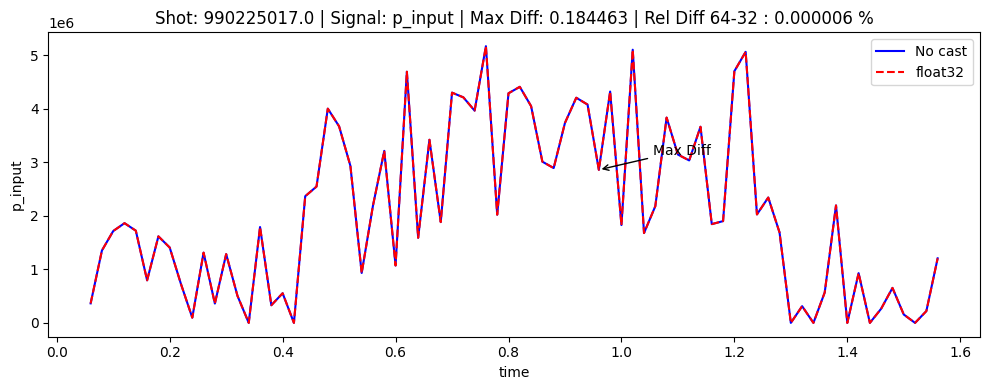

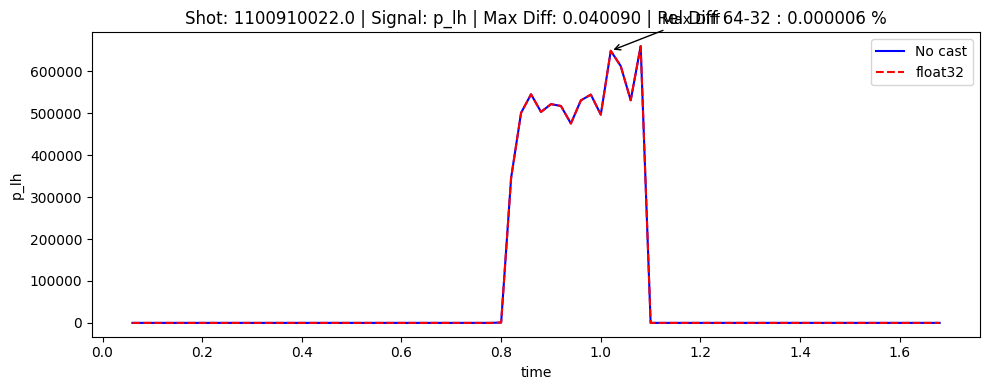

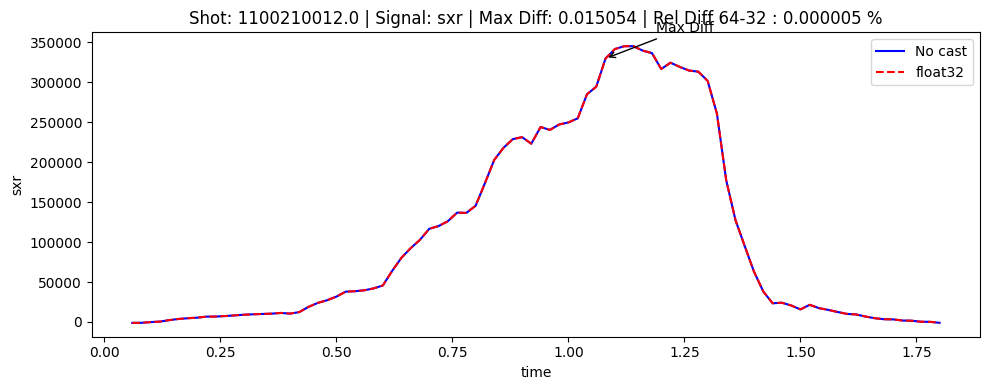

...

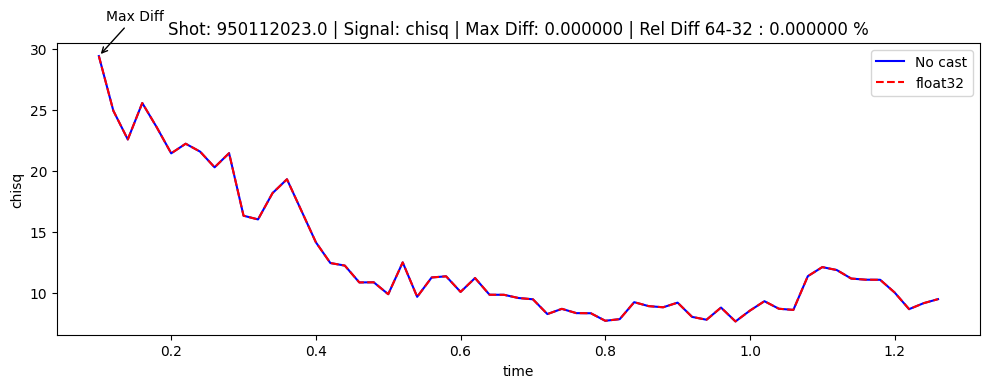

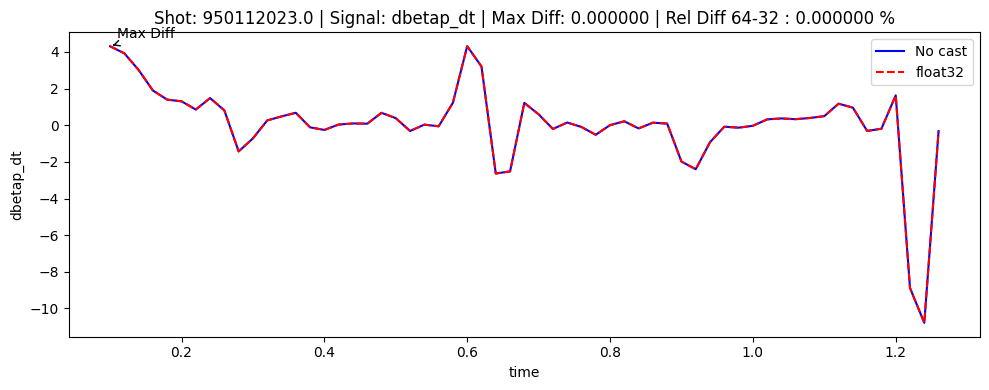

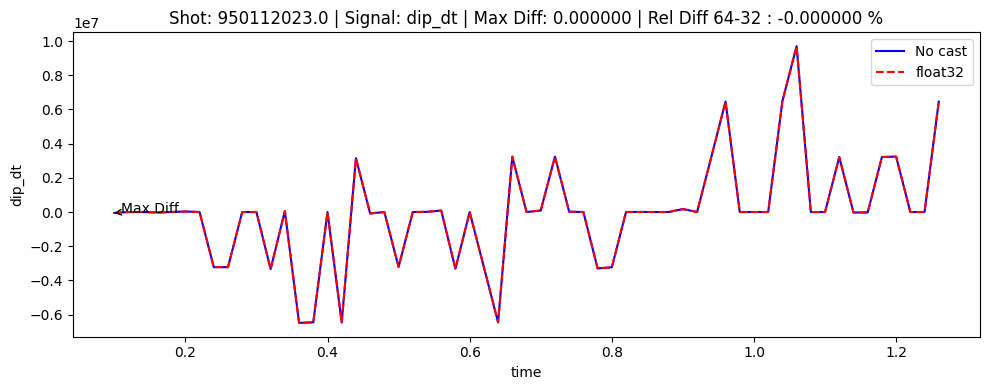

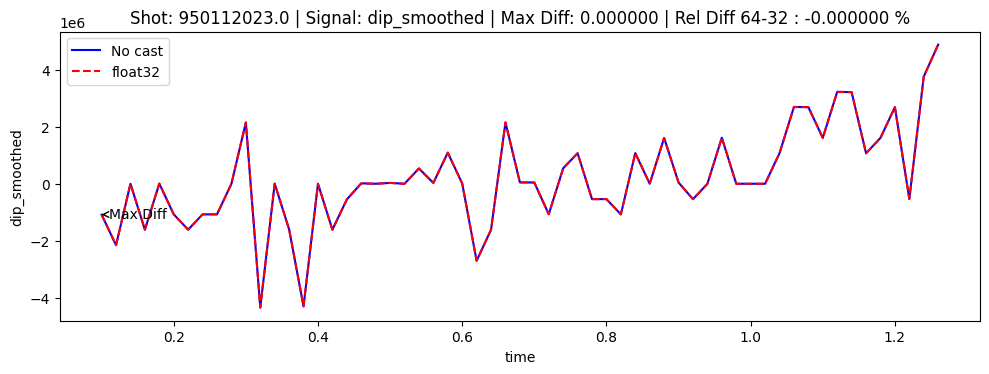

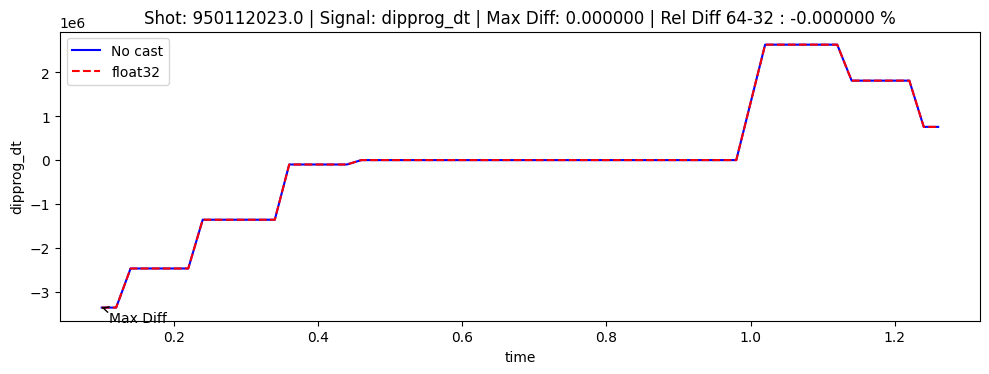

/tmp/ipykernel_3330964/522115459.py:24: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


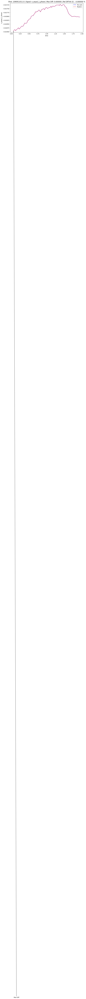

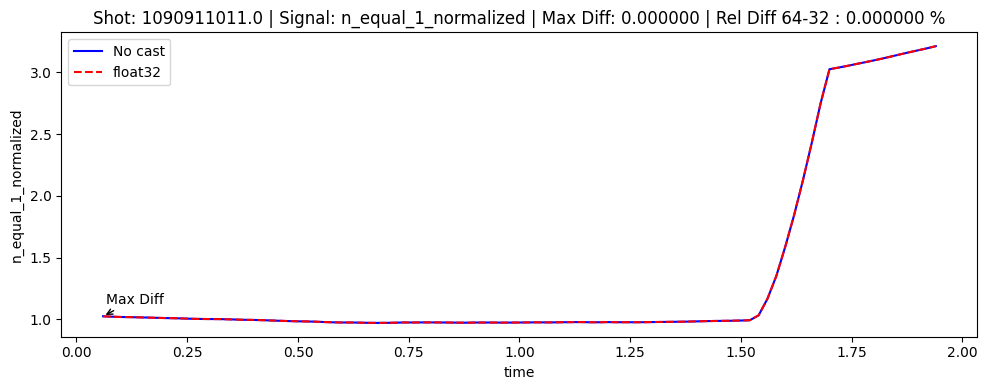

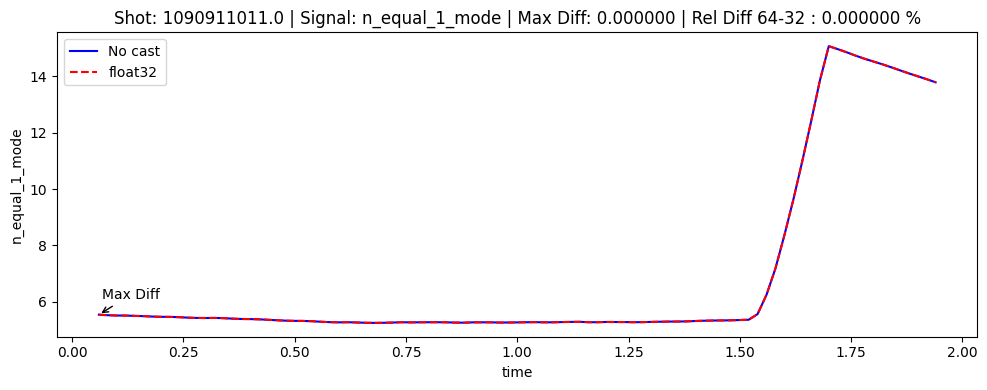

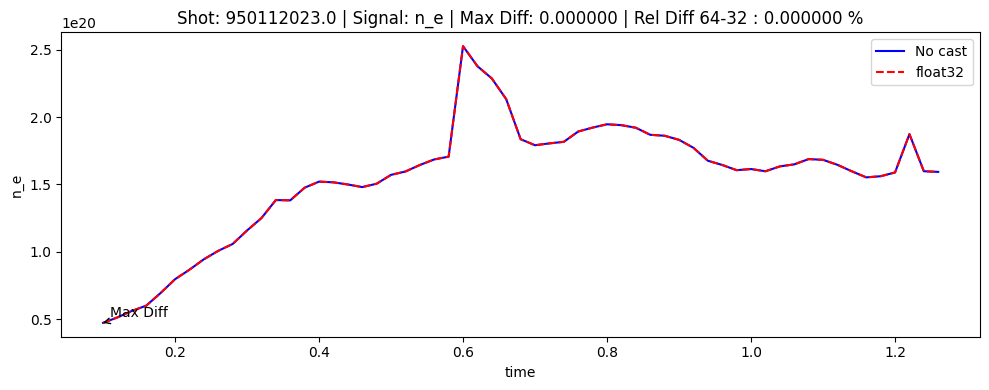

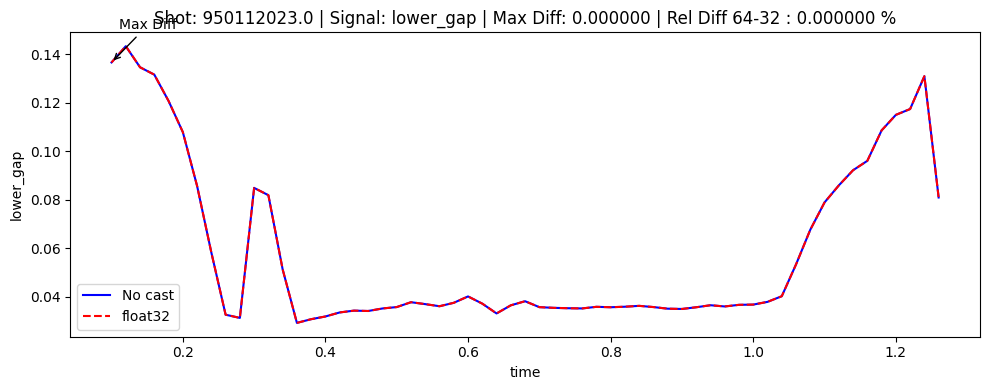

...

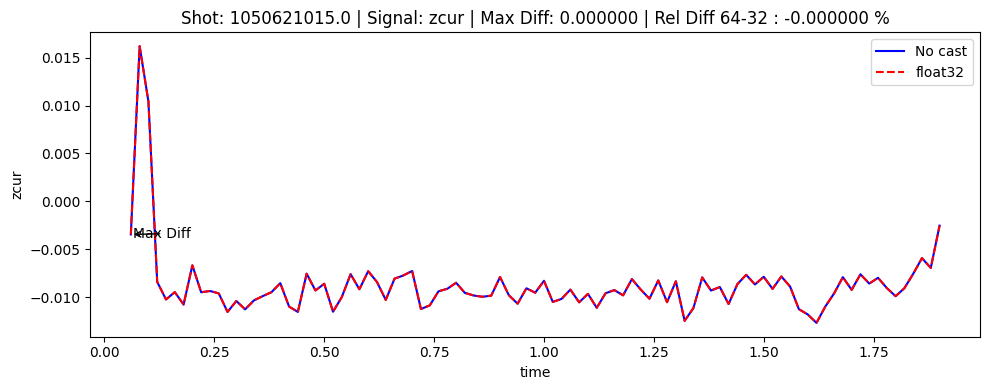

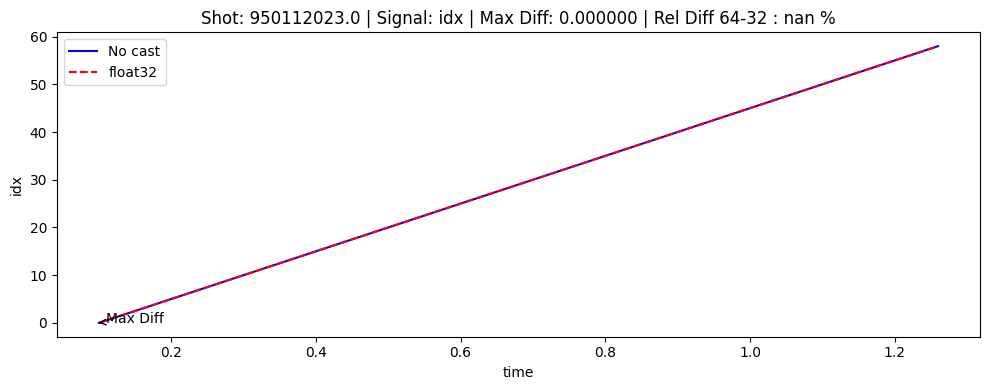

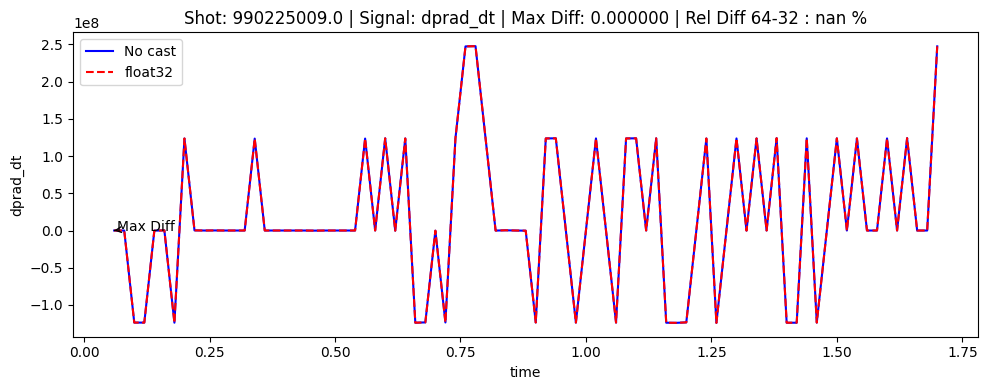

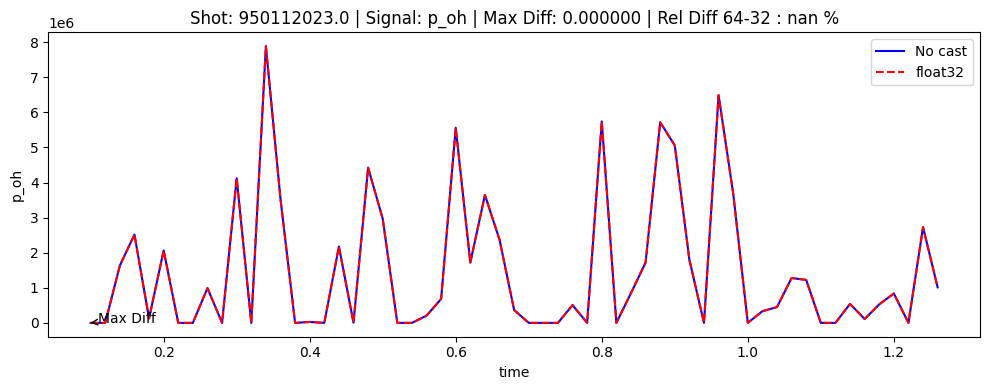

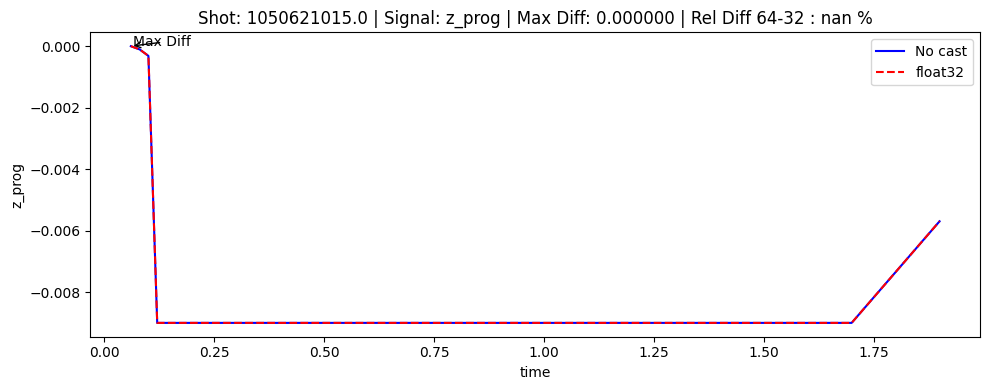

In [21]:
import matplotlib.pyplot as plt

for idx, row in max_diff_df_sorted.iterrows():
    shot = row['shot']
    signal = row['column']
    # Filter for the current shot
    dfNone_shot = dataNone[dataNone['shot'] == shot]
    df32_shot = df32[df32['shot'] == shot]
    if signal not in df32_shot.columns or signal not in df64_shot.columns:
        continue
    plt.figure(figsize=(10, 4))
    plt.plot(dfNone_shot['time'], dfNone_shot[signal], label='No cast', color='b')
    plt.plot(df32_shot['time'], df32_shot[signal], label='float32', color='r', linestyle='--')
    # add an arrow to the plot indicating the maximum difference time
    max_time = df32_shot.loc[row['row_index'], 'time']
    max_value_32 = df32_shot.loc[row['row_index'], signal]
    max_value_64 = dfNone_shot.loc[row['row_index'], signal]
    plt.annotate('Max Diff', xy=(max_time, max_value_32), xytext=(max_time + 0.1*max_time, max_value_32 + 0.1*max_value_32),
                 arrowprops=dict(facecolor='black', arrowstyle='->'))
    plt.title(f"Shot: {shot} | Signal: {signal} | Max Diff: {row['absolute_difference']:.6f} | Rel Diff 64-32 : {row['relative_difference_32_percent']:.6f} %")
    plt.xlabel('time')
    plt.ylabel(signal)
    plt.legend()
    plt.tight_layout()
    plt.show()